In [13]:
# !pip install ensemble_boxes

In [2]:
import pandas as pd
from ensemble_boxes import *
import numpy as np
from pycocotools.coco import COCO
import cv2
import matplotlib.pyplot as plt
import copy

In [12]:
# ensemble csv files
# submission lists
submission_files = [
    # '../work_dirs/submissions/0.6940.csv',
    # '../work_dirs/submissions/0.6942.csv',
    '../work_dirs/submissions/0.7198.csv',
    # '../work_dirs/autoassign_swin_l_fpn/submission_best_bbox_mAP_50_epoch_16.csv',
    '../work_dirs/cascadeRCNN_swin_l_fpp_rpn_cosineRe_ms_fold6/submission_best_bbox_mAP_50_epoch_13.csv',
    # '../work_dirs/cascadeRCNN_swin_l_rpn/submission_best_bbox_mAP_50_epoch_8.csv',
    # '../work_dirs/cascadeRCNN_r50_fpn/submission_best_bbox_mAP_50_epoch_23.csv',
    # '../work_dirs/sparseRCNN_swin_b_fpp_rpn_cosineRe_ms/submission_best_bbox_mAP_50_epoch_32.csv'
                   ]
submission_df = [pd.read_csv(file) for file in submission_files]

In [13]:
image_ids = submission_df[0]['image_id'].tolist()

In [14]:
# ensemble 할 file의 image 정보를 불러오기 위한 json
annotation = '../dataset2/test.json'
coco = COCO(annotation)

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


In [15]:
prediction_strings = []
file_names = []
# ensemble 시 설정할 iou threshold 
# 수정하면서 실습 하시면 됩니다!
iou_thr = 0.6
# weights=[0.15,0.85]
skip_box_thr = 0


# 각 image id 별로 submission file에서 box좌표 추출
for i, image_id in enumerate(image_ids):
    prediction_string = ''
    boxes_list = []
    scores_list = []
    labels_list = []
    image_info = coco.loadImgs(i)[0]
# 각 submission file 별로 prediction box좌표 불러오기
    for df in submission_df:
        predict_string = df[df['image_id'] == image_id]['PredictionString'].tolist()[0]
        predict_list = str(predict_string).split()
        
        if len(predict_list)==0 or len(predict_list)==1:
            continue
            
        predict_list = np.reshape(predict_list, (-1, 6))
        box_list = []
        
        for box in predict_list[:, 2:6].tolist():
            # bounding box 좌표값들이 0~1 사이의 값을 가져야 합니다.
            # Order: x1, y1, x2, y2
            box[0] = float(box[0]) / image_info['width']
            box[1] = float(box[1]) / image_info['height']
            box[2] = float(box[2]) / image_info['width']
            box[3] = float(box[3]) / image_info['height']
            box_list.append(box)
            
        boxes_list.append(box_list)
        scores_list.append(list(map(float, predict_list[:, 1].tolist())))
        labels_list.append(list(map(int, predict_list[:, 0].tolist())))
    
# 예측 box가 있다면 이를 ensemble 수행
# wbf 외에도 다른 ensemble을 사용할 수 있습니다
    if len(boxes_list):
        # boxes, scores, labels = nms(boxes_list, scores_list, labels_list, iou_thr=iou_thr)
        # boxes, scores, labels = soft_nms(boxes_list, scores_list, labels_list, iou_thr=iou_thr)
        # boxes, scores, labels = non_maximum_weighted(boxes_list, scores_list, labels_list, iou_thr=iou_thr)
        boxes, scores, labels = weighted_boxes_fusion(boxes_list, scores_list, labels_list, iou_thr=iou_thr)
        
        for box, score, label in zip(boxes, scores, labels):
            prediction_string += str(int(label)) + ' ' + str(score) + ' ' + str(box[0] * image_info['width']) + ' ' + str(box[1] * image_info['height']) + ' ' + str(box[2] * image_info['width']) + ' ' + str(box[3] * image_info['height']) + ' '
    
    prediction_strings.append(prediction_string)
    file_names.append(image_id)

/opt/conda/envs/openmmlab/lib/python3.7/site-packages/ensemble_boxes/ensemble_boxes_wbf.py:73: UserWarning: X2 > 1 in box. Set it to 1. Check that you normalize boxes in [0, 1] range.
  warnings.warn('X2 > 1 in box. Set it to 1. Check that you normalize boxes in [0, 1] range.')
/opt/conda/envs/openmmlab/lib/python3.7/site-packages/ensemble_boxes/ensemble_boxes_wbf.py:85: UserWarning: Y2 > 1 in box. Set it to 1. Check that you normalize boxes in [0, 1] range.
  warnings.warn('Y2 > 1 in box. Set it to 1. Check that you normalize boxes in [0, 1] range.')


In [16]:
submission = pd.DataFrame()
submission['PredictionString'] = prediction_strings
submission['image_id'] = file_names

submission.head()

,PredictionString,image_id
0,7 0.990291953086853 604.1549072265625 525.4390...,test/0000.jpg
1,5 0.9608439803123474 133.7586212158203 0.75943...,test/0001.jpg
2,1 0.9030039310455322 293.9947509765625 315.782...,test/0002.jpg
3,9 0.9687076210975647 152.03419494628906 271.75...,test/0003.jpg
4,1 0.932161808013916 210.25723266601562 271.400...,test/0004.jpg


In [17]:
submission.to_csv('../work_dirs/ensemble/submission2_ensemble_fold6_0.7189.csv',index=False)

# Visualization

In [9]:
def get_box_label(df,idx,image_id):
    box_list = []
    label_list = []
    image_info = coco.loadImgs(idx)[0]
    
    predict_string = df[df['image_id'] == image_id]['PredictionString'].tolist()[0]
    predict_list = str(predict_string).split()
    
    if len(predict_list)==0 or len(predict_list)==1:
        return
        
    predict_list = np.reshape(predict_list, (-1, 6))
    
    
    for box in predict_list[:, 2:6].tolist():
        box[0] = float(box[0]) 
        box[1] = float(box[1]) 
        box[2] = float(box[2]) 
        box[3] = float(box[3]) 
        box_list.append(box)
        
    
    label_list = (list(map(int, map(float,predict_list[:, 0].tolist()))))
    return box_list, label_list

In [10]:
import random
# id range 0 ~ 4870
img_idxes = [random.randrange(0,4870) for _ in range(5)]
img_idxes

[169, 1048, 661, 2692, 2167]

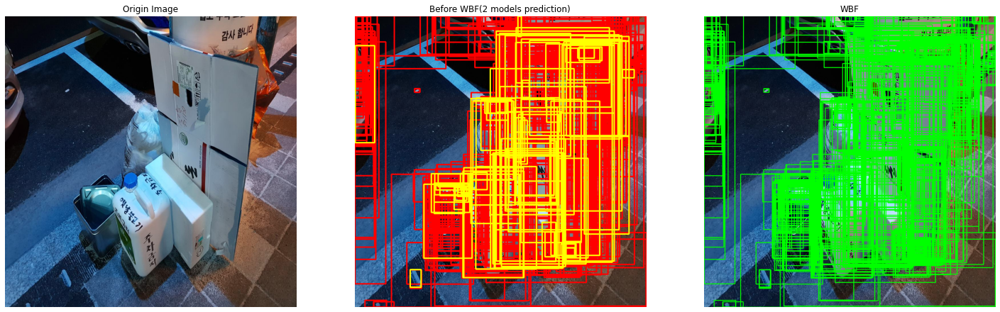

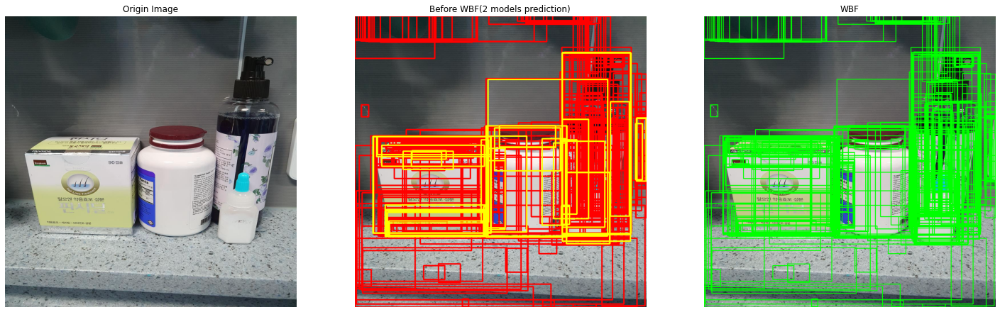

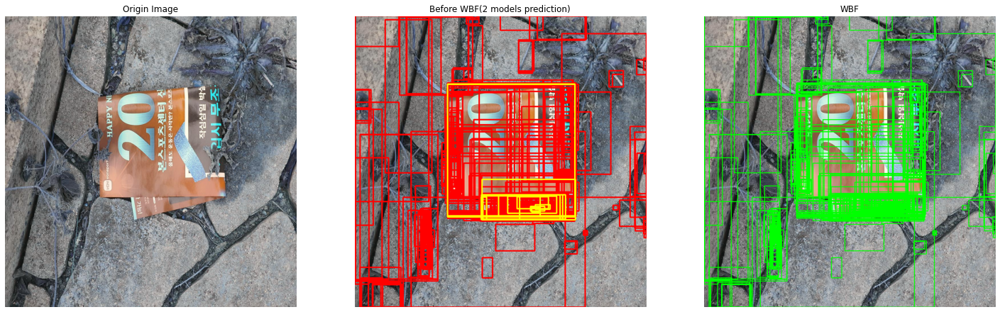

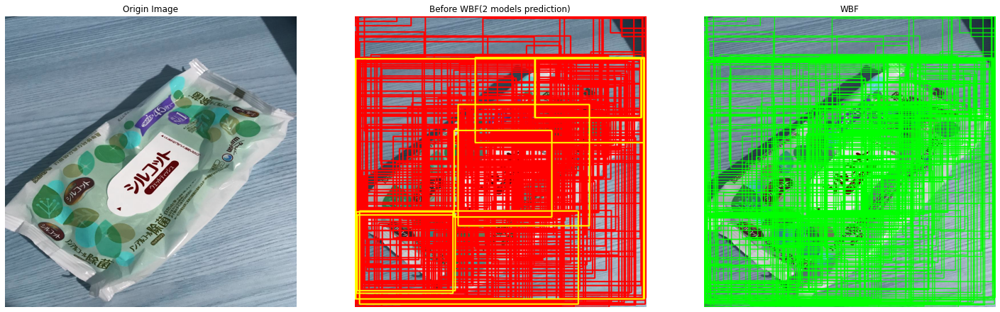

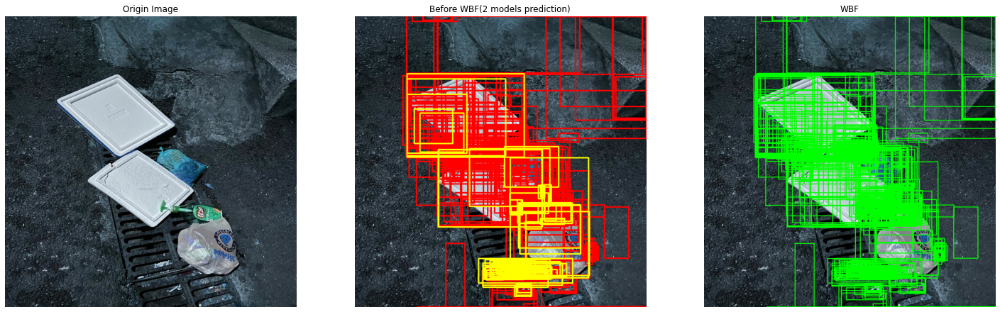

In [11]:
data_dir = '/opt/ml/level2-object-detection-level2-cv-14/dataset2/'
# submission = pd.read_csv('../work_dirs/ensemble/0.6663_0.6633_thr_0.6_skip_0.1_submission_ensemble.csv') 
for img_idx in img_idxes:
    img_id = coco.loadImgs(img_idx)[0]['file_name']
    img_path=data_dir+ img_id
    img = cv2.imread(img_path)

    fig, axes = plt.subplots(1, 3)
    fig.set_size_inches(25, 14)

    # 최대 6개 모델을 앙상블 한다 가정하고 6 색상을 준비했습니다
    # 모델을 더 추가해서 확인해 보고 싶으신 분들은 색상을 추가해주시면 됩니다!
    # 순서 red, yellow,blue,aqua,mazenta,lime
    color = [(255,0,0),(255,255,0),(0,0,255),(0,255,255),(255,0,255),(0,255,0)]

    img_origin = img.copy()
    img_wbf = img.copy()

    for i,df in enumerate(submission_df):
        boxes, labels = get_box_label(df,img_idx,img_id)
        for box,label in zip(boxes,labels):
            x1,y1,x2,y2 = map(int,box)
            cv2.rectangle(img, (x1, y1), (x2, y2), color[i], 3)
            
                


    boxes, labels = get_box_label(submission,img_idx,img_id)
    for box,label in zip(boxes,labels):
        x1,y1,x2,y2 = map(int,box)
        cv2.rectangle(img_wbf, (x1, y1), (x2, y2), color[-1], 2)


    axes[0].imshow(img_origin)
    axes[0].set_title("Origin Image")
    axes[0].axis('off')

    axes[1].imshow(img)
    axes[1].set_title(f"Before WBF({len(submission_df)} models prediction)")
    axes[1].axis('off')

    axes[2].imshow(img_wbf)
    axes[2].set_title("WBF")
    axes[2].axis('off')



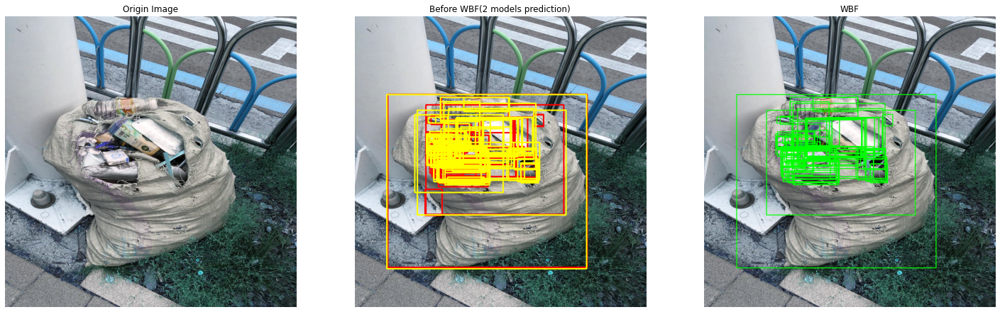

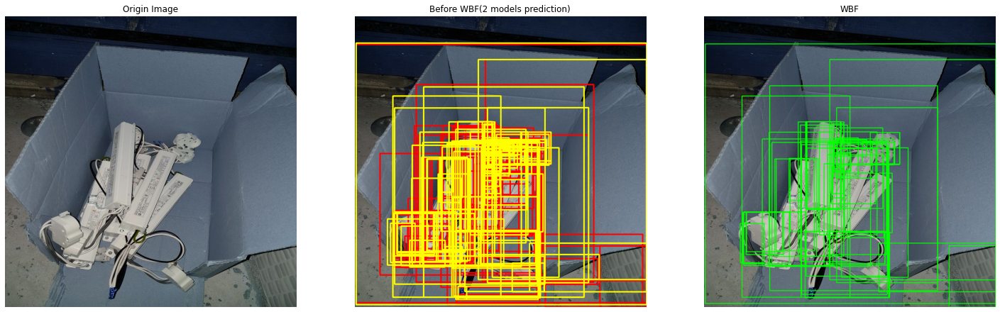

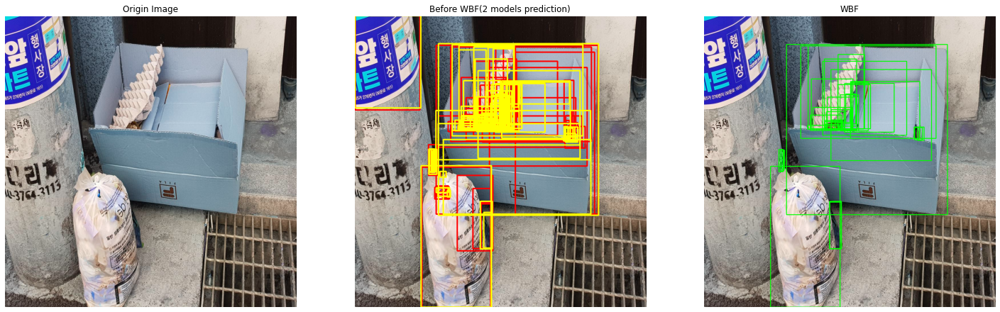

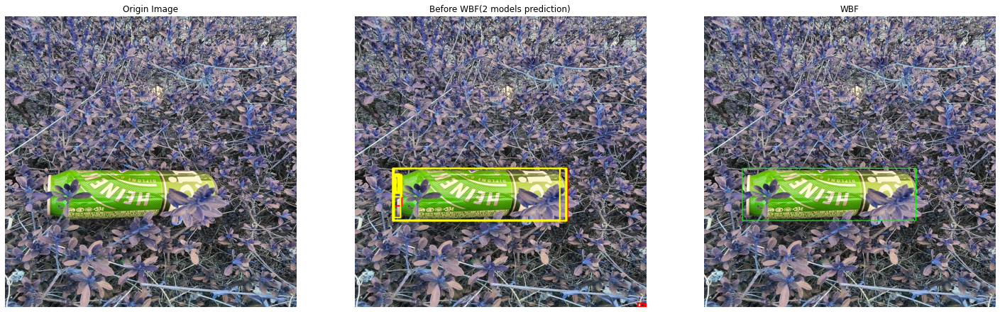

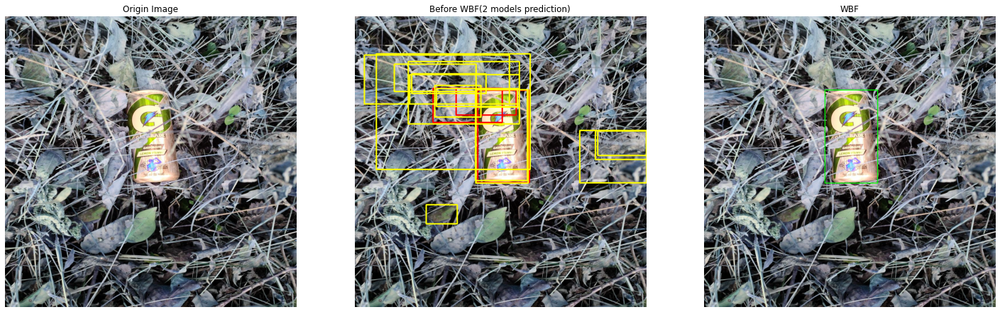

In [99]:
data_dir = '/opt/ml/level2-object-detection-level2-cv-14/dataset2/'

submission = pd.read_csv('../work_dirs/ensemble/0.6663_0.6633_thr_0.6_skip_0.05_submission_ensemble.csv') 

for img_idx in img_idxes:
    img_id = coco.loadImgs(img_idx)[0]['file_name']
    img_path=data_dir+ img_id
    img = cv2.imread(img_path)

    fig, axes = plt.subplots(1, 3)
    fig.set_size_inches(25, 14)

    # 최대 6개 모델을 앙상블 한다 가정하고 6 색상을 준비했습니다
    # 모델을 더 추가해서 확인해 보고 싶으신 분들은 색상을 추가해주시면 됩니다!
    # 순서 red, yellow,blue,aqua,mazenta,lime
    color = [(255,0,0),(255,255,0),(0,0,255),(0,255,255),(255,0,255),(0,255,0)]

    img_origin = img.copy()
    img_wbf = img.copy()

    for i,df in enumerate(submission_df):
        boxes, labels = get_box_label(df,img_idx,img_id)
        for box,label in zip(boxes,labels):
            x1,y1,x2,y2 = map(int,box)
            cv2.rectangle(img, (x1, y1), (x2, y2), color[i], 3)
            
                


    boxes, labels = get_box_label(submission,img_idx,img_id)
    for box,label in zip(boxes,labels):
        x1,y1,x2,y2 = map(int,box)
        cv2.rectangle(img_wbf, (x1, y1), (x2, y2), color[-1], 2)


    axes[0].imshow(img_origin)
    axes[0].set_title("Origin Image")
    axes[0].axis('off')

    axes[1].imshow(img)
    axes[1].set_title(f"Before WBF({len(submission_df)} models prediction)")
    axes[1].axis('off')

    axes[2].imshow(img_wbf)
    axes[2].set_title("WBF")
    axes[2].axis('off')
